## Ingestion of data from an API (E-Commerce Data)
We will ingest data from API into a database dataframe and then query the data create visuals.
Data belong to UCI Machine Learning Repository from Kaggle.

In [0]:
#import the necessary library 
import requests
import pandas as pd
from io import BytesIO
import zipfile
from pyspark.sql.functions import to_timestamp

# Kaggle API credentials
KAGGLE_USERNAME = "shivampatidar1499"
KAGGLE_KEY = "a9ae186aaffc393879214d1d08d31a43"

# Kaggle dataset API URL
dataset_url = "https://www.kaggle.com/api/v1/datasets/download/carrie1/ecommerce-data"

# Request the dataset with authentication
response = requests.get(
    dataset_url,
    auth=(KAGGLE_USERNAME, KAGGLE_KEY),
    stream=True
)

# Check if the request was successful
if response.status_code == 200:
    # Unzip the dataset
    with zipfile.ZipFile(BytesIO(response.content)) as z:
        # Assuming the CSV file is the first file in the zip
        with z.open(z.namelist()[0]) as csvfile:
            df = pd.read_csv(csvfile, encoding='ISO-8859-1')
            print("DataFrame created successfully.")
            display(df.head())
else:
    print(f"Failed to fetch dataset: {response.status_code}, {response.text}")

# Create Spark DataFrame from Pandas DataFrame
spark_df = spark.createDataFrame(df)

# Drop rows with missing essential columns
spark_df = spark_df.na.drop(subset=["InvoiceNo", "StockCode", "InvoiceDate", "Quantity", "UnitPrice", "CustomerID", "Country"])


display(spark_df.head())

DataFrame created successfully.


InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


Row(InvoiceNo='536365', StockCode='85123A', Description='WHITE HANGING HEART T-LIGHT HOLDER', Quantity=6, InvoiceDate='12/1/2010 8:26', UnitPrice=2.55, CustomerID=17850.0, Country='United Kingdom')

In [0]:
from pyspark.sql.functions import to_timestamp, year, month

# Add a Sales Column: Create a new column, Sales = Quantity * UnitPrice
spark_df = spark_df.withColumn('Sales', spark_df['Quantity'] * spark_df['UnitPrice'])

#Create temporary table for data analysis
spark_df.createOrReplaceTempView("sls_tbl")

# Convert InvoiceDate to timestamp
spark_df = spark_df.withColumn("InvoiceDate", to_timestamp(spark_df["InvoiceDate"], "M/d/yyyy H:mm"))
spark_df = spark_df.withColumn('Year', year('InvoiceDate'))
spark_df = spark_df.withColumn('Month', month('InvoiceDate'))

display(spark_df)

InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Sales,Year,Month
536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01T08:26:00Z,2.55,17850.0,United Kingdom,15.299999999999999,2010,12
536365,71053,WHITE METAL LANTERN,6,2010-12-01T08:26:00Z,3.39,17850.0,United Kingdom,20.34,2010,12
536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01T08:26:00Z,2.75,17850.0,United Kingdom,22.0,2010,12
536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01T08:26:00Z,3.39,17850.0,United Kingdom,20.34,2010,12
536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01T08:26:00Z,3.39,17850.0,United Kingdom,20.34,2010,12
536365,22752,SET 7 BABUSHKA NESTING BOXES,2,2010-12-01T08:26:00Z,7.65,17850.0,United Kingdom,15.3,2010,12
536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,2010-12-01T08:26:00Z,4.25,17850.0,United Kingdom,25.5,2010,12
536366,22633,HAND WARMER UNION JACK,6,2010-12-01T08:28:00Z,1.85,17850.0,United Kingdom,11.100000000000001,2010,12
536366,22632,HAND WARMER RED POLKA DOT,6,2010-12-01T08:28:00Z,1.85,17850.0,United Kingdom,11.100000000000001,2010,12
536367,84879,ASSORTED COLOUR BIRD ORNAMENT,32,2010-12-01T08:34:00Z,1.69,13047.0,United Kingdom,54.08,2010,12


## Visualize the Monthly Sales Analysis

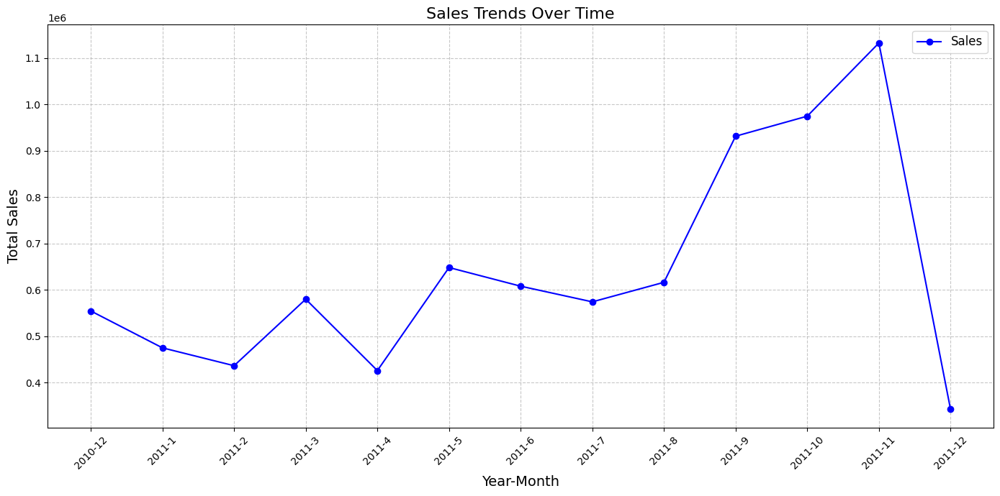

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

# Convert Spark DataFrame to Pandas DataFrame
pdf = spark_df.toPandas()

pdf['YearMonth'] = pdf['Year'].astype(str) + '-' + pdf['Month'].astype(str)

# Group by Year and Month, then aggregate Sales
time_sales = pdf.groupby(['Year', 'Month'])['Sales'].sum().reset_index()

# Create YearMonth for plotting
time_sales['YearMonth'] = time_sales['Year'].astype(str) + '-' + time_sales['Month'].astype(str)

# Sort by Year and Month for chronological order
time_sales = time_sales.sort_values(by=['Year', 'Month'])

# Plot the bar Graph for Sales
plt.figure(figsize=(14, 7))
plt.plot(time_sales['YearMonth'], time_sales['Sales'], marker='o', linestyle='-', color='blue', label='Sales')
plt.xticks(rotation=45)
plt.title('Sales Trends Over Time', fontsize=16)
plt.xlabel('Year-Month', fontsize=14)
plt.ylabel('Total Sales', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


## Visualize the top 10 products by Quantity.

Description,TotalQuantity
WORLD WAR 2 GLIDERS ASSTD DESIGNS,53215
JUMBO BAG RED RETROSPOT,45066
ASSORTED COLOUR BIRD ORNAMENT,35314
WHITE HANGING HEART T-LIGHT HOLDER,34147
PACK OF 72 RETROSPOT CAKE CASES,33409
POPCORN HOLDER,30504
RABBIT NIGHT LIGHT,27094
MINI PAINT SET VINTAGE,25880
PACK OF 12 LONDON TISSUES,25321
PACK OF 60 PINK PAISLEY CAKE CASES,24163


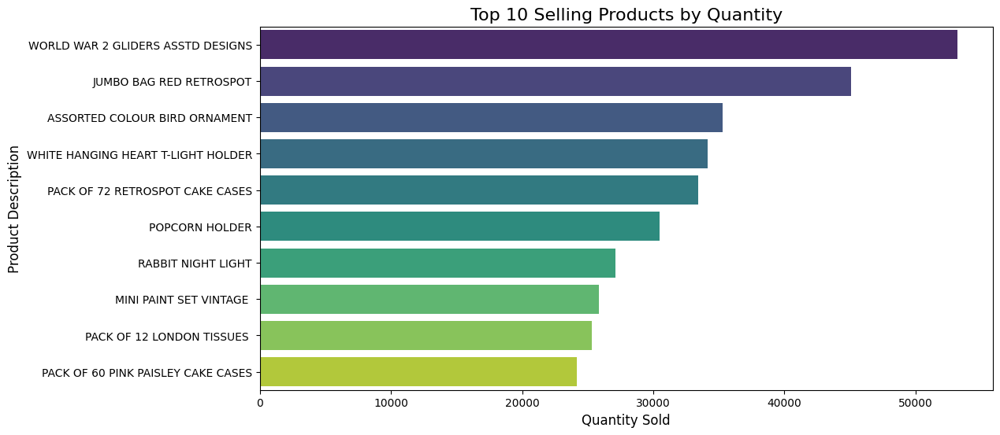

In [0]:
from pyspark.sql.functions import col, sum
import matplotlib.pyplot as plt
import seaborn as sns

# Aggregate sales by product
product_sales = spark_df.groupBy('Description').agg(sum('Quantity').alias('TotalQuantity')).orderBy(col('TotalQuantity').desc())

# Get the top 10 products
top_products = product_sales.limit(10)

# Convert to Pandas DataFrame
top_products_pdf = top_products.toPandas()

# Display results
display(top_products_pdf)

# Visualize top-selling products by quantity using matplotlib and Seaborn library
plt.figure(figsize=(12, 6))
sns.barplot(data=top_products_pdf, x='TotalQuantity', y='Description', palette='viridis')
plt.title('Top 10 Selling Products by Quantity', fontsize=16)
plt.xlabel('Quantity Sold', fontsize=12)
plt.ylabel('Product Description', fontsize=12)
plt.show()

## Visualize Top 10 Countires sales

In [0]:
from pyspark.sql.functions import col, sum

# Aggregate sales by country
country_sales = spark_df.groupBy('Country').agg(sum('Sales').alias('TotalSales')).orderBy(col('TotalSales').desc())

# Display results
display(country_sales)


Country,TotalSales
United Kingdom,6767873.393999949
Netherlands,284661.54
EIRE,250285.22
Germany,221698.21
France,196712.84000000003
Australia,137077.27
Switzerland,55739.39999999999
Spain,54774.580000000016
Belgium,40910.959999999985
Sweden,36595.909999999996


Databricks visualization. Run in Databricks to view.

## Visualize the Top 10 product return by Quantity

In [0]:
%sql



-- List of product returned by quantity


SELECT StockCode, Description, SUM(Quantity) AS TotalQuantity
FROM sls_tbl
WHERE Quantity < 0
GROUP BY StockCode, Description
ORDER BY TotalQuantity ASC;

StockCode,Description,TotalQuantity
23843,"PAPER CRAFT , LITTLE BIRDIE",-80995
23166,MEDIUM CERAMIC TOP STORAGE JAR,-74494
84347,ROTATING SILVER ANGELS T-LIGHT HLDR,-9367
M,Manual,-3995
21108,FAIRY CAKE FLANNEL ASSORTED COLOUR,-3150
20971,PINK BLUE FELT CRAFT TRINKET BOX,-2617
85123A,WHITE HANGING HEART T-LIGHT HOLDER,-2578
21175,GIN + TONIC DIET METAL SIGN,-2030
22920,HERB MARKER BASIL,-1527
22273,FELTCRAFT DOLL MOLLY,-1447


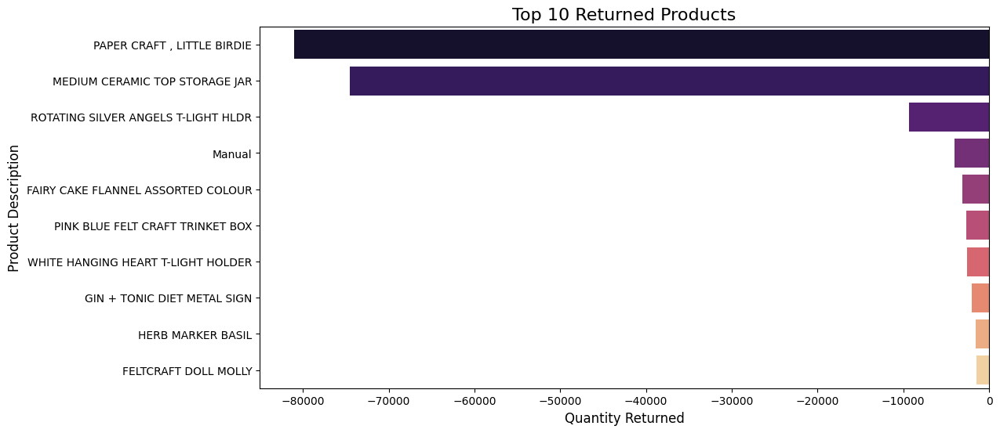

In [0]:
# Top 10 products by returns as per quantity

# Filter returns
returns = pdf[pdf['Quantity'] < 0]
returns_by_product = returns.groupby(['StockCode', 'Description'])['Quantity'].sum().reset_index()
top_returns = returns_by_product.sort_values(by='Quantity', ascending=True).head(10)

# Plot returns
plt.figure(figsize=(12, 6))
sns.barplot(data=top_returns, x='Quantity', y='Description', palette='magma')
plt.title('Top 10 Returned Products', fontsize=16)
plt.xlabel('Quantity Returned', fontsize=12)
plt.ylabel('Product Description', fontsize=12)
plt.show()


## Average Order Value

In [0]:
%sql

SELECT AVG(OrderValue) as AverageOrderValue
FROM (
    SELECT InvoiceNo, SUM(Sales) as OrderValue
    FROM sls_tbl
    GROUP BY InvoiceNo
) as OrderValues


AverageOrderValue
374.0453273546618


## Visualize how Quantity and Sales correlate.

In [0]:
# Scatter plot for Quantity vs Sales
display(spark_df)

InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Sales,Year,Month
536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01T08:26:00Z,2.55,17850.0,United Kingdom,15.299999999999999,2010,12
536365,71053,WHITE METAL LANTERN,6,2010-12-01T08:26:00Z,3.39,17850.0,United Kingdom,20.34,2010,12
536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01T08:26:00Z,2.75,17850.0,United Kingdom,22.0,2010,12
536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01T08:26:00Z,3.39,17850.0,United Kingdom,20.34,2010,12
536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01T08:26:00Z,3.39,17850.0,United Kingdom,20.34,2010,12
536365,22752,SET 7 BABUSHKA NESTING BOXES,2,2010-12-01T08:26:00Z,7.65,17850.0,United Kingdom,15.3,2010,12
536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,2010-12-01T08:26:00Z,4.25,17850.0,United Kingdom,25.5,2010,12
536366,22633,HAND WARMER UNION JACK,6,2010-12-01T08:28:00Z,1.85,17850.0,United Kingdom,11.100000000000001,2010,12
536366,22632,HAND WARMER RED POLKA DOT,6,2010-12-01T08:28:00Z,1.85,17850.0,United Kingdom,11.100000000000001,2010,12
536367,84879,ASSORTED COLOUR BIRD ORNAMENT,32,2010-12-01T08:34:00Z,1.69,13047.0,United Kingdom,54.08,2010,12


Databricks visualization. Run in Databricks to view.

## The table below displays the quantities purchased and returned by each customer

In [0]:
%sql
WITH Purchases AS (
    SELECT CustomerID, SUM(Quantity) AS TotalPurchased
    FROM sls_tbl
    WHERE Quantity > 0
    GROUP BY CustomerID
),
Returns AS (
    SELECT CustomerID, SUM(Quantity) AS TotalReturned
    FROM sls_tbl
    WHERE Quantity < 0
    GROUP BY CustomerID
)
SELECT 
    p.CustomerID,
    p.TotalPurchased,
    r.TotalReturned
FROM Purchases p
LEFT JOIN Returns r
ON p.CustomerID = r.CustomerID;


CustomerID,TotalPurchased,TotalReturned
16916.0,440,null
17884.0,854,null
15311.0,38194,-474
17659.0,1525,-39
12967.0,438,-195
17062.0,430,-2
16353.0,2006,null
16539.0,477,null
15823.0,1,-284
12600.0,774,-1
